# Exploration of Different ways of Visualizing CNN

***Inspired by Chapter 5 of "Deep Learning with Python" by Francois Chollet***

- output of hidden layers
- input that activates certain hidden features
- classification activation map(CAM) overlayed on original images

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

In [2]:
import torch
from torch.autograd import Variable
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader

from torchvision import models, transforms

## find some test data

(500, 353)


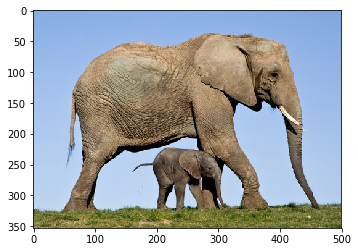

In [31]:
image = Image.open("1.jpg")
print(image.size)
plt.imshow(image)

## transform

In [32]:
preprocess = transforms.Compose([
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[.485, .456, .406],
                         std=[.229, .224, .225])
])

In [33]:
img_tensor = preprocess(image).unsqueeze(dim=0)
img_tensor.size()

torch.Size([1, 3, 224, 224])

## helper function

In [34]:
def display_grid(img_grid, how="mat", cmap=None):
    """img_grid: np.array of size(n_images, w, h)
    """
    nimg = img_grid.shape[0]
    ncol = int(np.sqrt(nimg))
    nrow = int(np.ceil(nimg / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(4*nrow, 4*ncol))
    if nimg > 1:
        axes = axes.ravel()
    else:
        axes = [axes]
    fig.tight_layout()
    fig.subplots_adjust(hspace=0, wspace=0)
    
    for i in range(nimg):
        if how == "mat":
            axes[i].matshow(img_grid[i, :, :], cmap=cmap)
        else:
            axes[i].imshow(img_grid[i, ...], cmap=cmap)
        axes[i].set_axis_off()

## load pretrained image

In [26]:
vgg16 = models.vgg16(pretrained=True).cuda()

In [27]:
list(vgg16.children())

[Sequential (
   (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (1): ReLU (inplace)
   (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (3): ReLU (inplace)
   (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
   (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (6): ReLU (inplace)
   (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (8): ReLU (inplace)
   (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
   (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (11): ReLU (inplace)
   (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (13): ReLU (inplace)
   (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (15): ReLU (inplace)
   (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
   (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   (18): ReLU (inplace)

In [37]:
vgg16.eval()
logits = vgg16(Variable(img_tensor.cuda()))
logit_vals = logits.squeeze().cpu().data.numpy()
logits.size()

torch.Size([1, 1000])

### get class names
!wget https://s3.amazonaws.com/cadl/models/synset.txt

In [38]:
class_names = np.array([n.strip() for n in open("synset.txt").readlines()])

In [39]:
top5 = logit_vals.argsort()[::-1][:5]
class_names[top5]

array(['n02504458 African elephant, Loxodonta africana',
       'n01871265 tusker', 'n02504013 Indian elephant, Elephas maximus',
       'n01704323 triceratops', 'n02113978 Mexican hairless'], 
      dtype='<U131')

## Visualization 1 - output of hidden layer

In [40]:
conv_layers = list(vgg16.children())[0]
conv_layers

Sequential (
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU (inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU (inplace)
  (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU (inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU (inplace)
  (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU (inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU (inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU (inplace)
  (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (18): ReLU (inplace)
  (19): Conv2d(512,

In [41]:
conv_model = nn.Sequential(*[conv_layers[i] for i in range(8)])
conv_model

Sequential (
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU (inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU (inplace)
  (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU (inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [42]:
conv_model.eval()
conv_output = conv_model(Variable(img_tensor.cuda()))
conv_output = conv_output.squeeze().cpu().data.numpy()
conv_output.shape

(128, 112, 112)

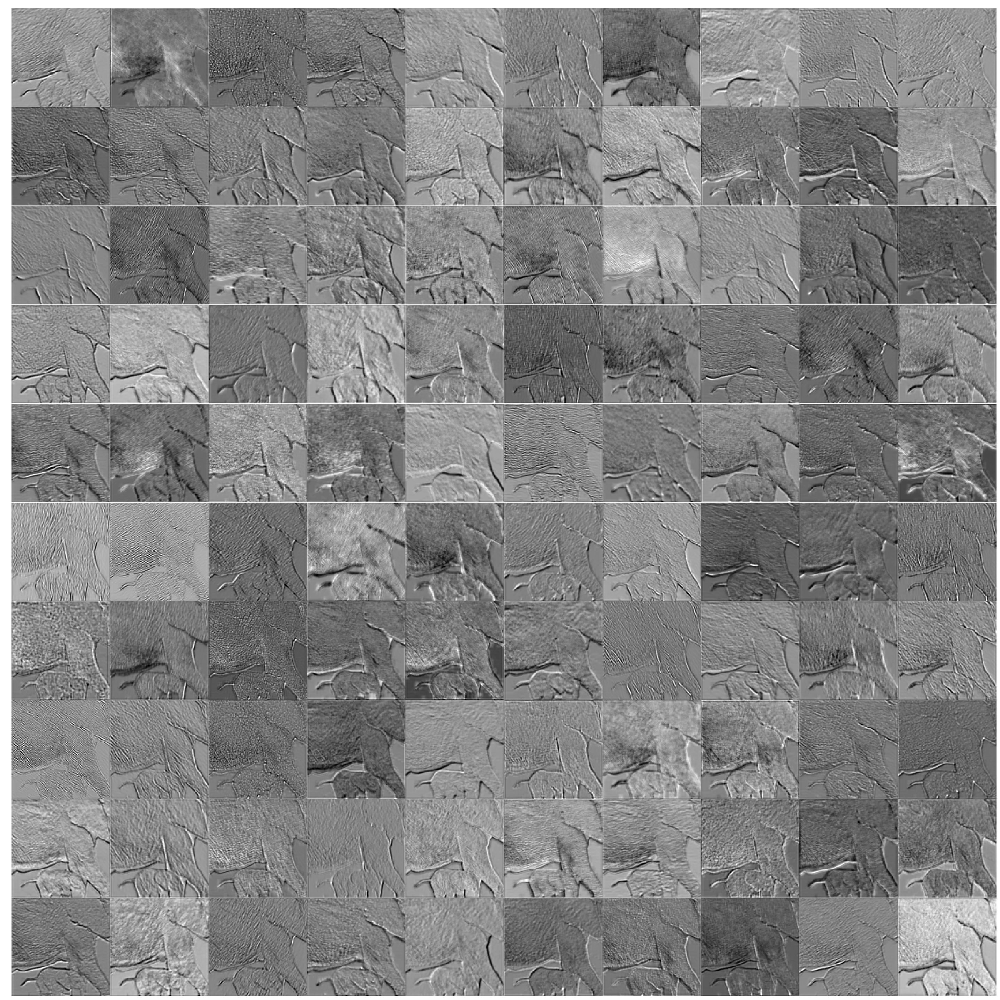

In [43]:
display_grid(conv_output[:100,:,:], cmap=plt.cm.gray)

## Visualization 2 - inputs that activate certain neurons

In [44]:
conv_layers

Sequential (
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU (inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU (inplace)
  (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU (inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU (inplace)
  (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU (inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU (inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU (inplace)
  (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (18): ReLU (inplace)
  (19): Conv2d(512,

In [45]:
conv_model = nn.Sequential(*[conv_layers[i] for i in range(26)])
conv_model

Sequential (
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU (inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU (inplace)
  (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU (inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU (inplace)
  (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU (inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU (inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU (inplace)
  (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
  (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (18): ReLU (inplace)
  (19): Conv2d(512,

***Here to declare a "leaf-node" variable, don't put it on gpu, otherwise it is treated as non-leaf node and the grad won't be accessible by default***

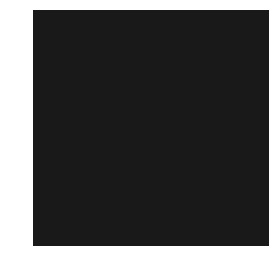

In [46]:
# x = Variable(torch.rand([1, 3, 224, 224])*0.1, requires_grad=True)
# x = Variable(torch.zeros([1, 3, 224, 224]), requires_grad=True)
x = Variable(torch.ones([1, 3, 224, 224])*0.1, requires_grad=True)
display_grid(x.cpu().data.numpy().transpose([0, 2, 3, 1]), how="img")
cuda_x = x.cuda()

In [47]:
n_epochs = 200
node_i = 102

optimizer = optim.SGD([x], lr=0.1)

for epoch in range(n_epochs):
    conv_output = conv_model(x.cuda())
    
    loss = -torch.mean(conv_output[:,node_i,...])
    loss.backward()
    optimizer.step()
    if epoch % 20 == 0:
        print(epoch, loss.data[0])

0 -0.08476334065198898
20 -3.1409668922424316
40 -28.0803279876709
60 -76.52880859375
80 -137.8635711669922
100 -213.18966674804688
120 -305.67889404296875
140 -417.9859619140625
160 -551.73095703125
180 -707.6101684570312


In [48]:
generated = x.cpu().data.numpy().transpose([0, 2, 3, 1])
generated = (generated - generated.min()) / (generated.max()-generated.min())
generated.min(), generated.max()

(0.0, 1.0)

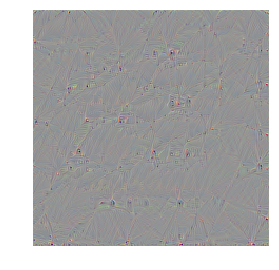

In [49]:
display_grid(generated, how="img")

### wrap it up - visualization 2

In [50]:
from tqdm import tqdm_notebook

In [51]:
def deep_dream(model, n_nodes):
    n_epochs = 100
    
    generated_imgs = []
    
    for node_i in tqdm_notebook(range(n_nodes)):
        x = Variable(torch.zeros([1, 3, 224, 224])+0.01, requires_grad=True) # avoid deactivating relu?
        cuda_x = x.cuda()
        optimizer = optim.SGD([x], lr=0.1)

        for epoch in range(n_epochs):
            conv_output = conv_model(x.cuda())

            loss = -torch.mean(conv_output[:,node_i,...])
            loss.backward()
            optimizer.step()
        generated = x.cpu().data.numpy().transpose([0, 2, 3, 1])
        generated = (generated - generated.min()) / (generated.max()-generated.min())
        generated_imgs.append(generated)
        
    generated_grid = np.concatenate(generated_imgs, axis=0)
    return generated_grid

In [52]:
%time dreams = deep_dream(conv_model, 100)

/home/dola/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in true_divide



CPU times: user 43min 29s, sys: 2min 50s, total: 46min 19s
Wall time: 6min 35s


*** Dead Relu in layers***

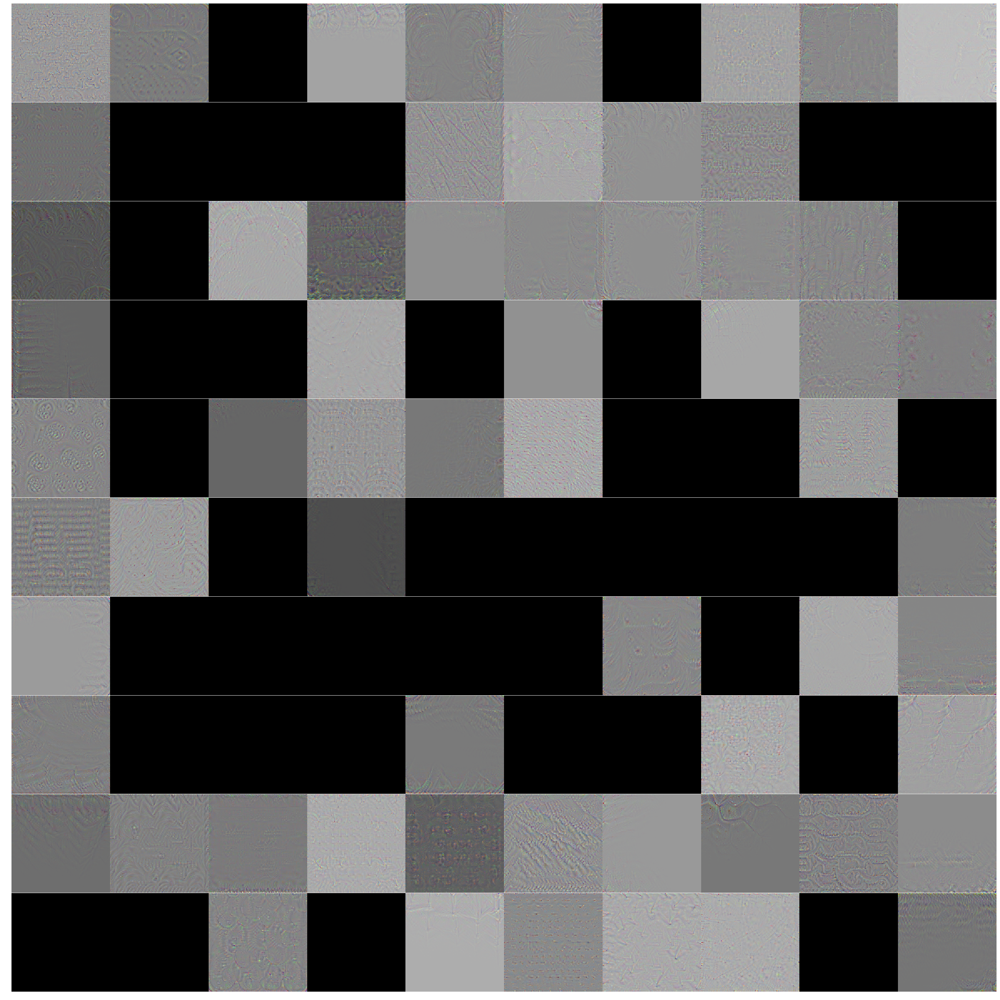

In [53]:
display_grid(dreams, how="img")

## Visualize 3 - CAM (classification activation map)
- on a certain convolution layer - weight different channels by their contributions to a classficiation (aka their gradients)
- combine the convolution feature map by weighted sum of all channels - that's the heatmap
- resize and overlay the heatmap on original image

In [54]:
vgg16

VGG (
  (features): Sequential (
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU (inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU (inplace)
    (4): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU (inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU (inplace)
    (9): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU (inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU (inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU (inplace)
    (16): MaxPool2d (size=(2, 2), stride=(2, 2), dilation=(1, 1))
    (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), pa

In [55]:
## look at the classification result
vgg16.eval()
logits = vgg16(Variable(img_tensor.cuda()))
logit_vals = logits.squeeze().cpu().data.numpy()

top5 = logit_vals.argsort()[::-1][:5]
list(zip(top5,class_names[top5]))

[(386, 'n02504458 African elephant, Loxodonta africana'),
 (101, 'n01871265 tusker'),
 (385, 'n02504013 Indian elephant, Elephas maximus'),
 (51, 'n01704323 triceratops'),
 (268, 'n02113978 Mexican hairless')]

so we are targeting at top5[0]

In [56]:
top5[0], logits[:,top5[0]]

(386, Variable containing:
  31.3606
 [torch.cuda.FloatTensor of size 1 (GPU 0)])

As suggested in the pytorch forum, we need to use a hook function to read gradients of non-leaf variables, such as the outputs of intermediate convlutionary layers

In [57]:
class GradientHook(object):
    def __init__(self, name):
        self.name = name
        self.gradient = None
    def __call__(self, gradient):
        print(self.name, "here")
        self.gradient = gradient

In [58]:
## The new Vgg 16 model will have probs at intermediate layers



class NewVgg16(nn.Module):
    def __init__(self, original_model, inspect_layers):
        super(NewVgg16, self).__init__()
        self.model = original_model
        self.inspect_layers = set(inspect_layers)
        self.inspections = {}
        self.grads = {}
    def forward(self, x):
        out = x
        for i, layer in enumerate(list(self.model.features.children())):
#             print(i, self.inspect_layers)
            out = layer(out)
            if i in self.inspect_layers:
                self.inspections[i] = out
                gh = GradientHook(name=i)
                out.register_hook(gh)
                self.grads[i] = out
#         print(out.size())
        out = out.view([x.size(0), -1])
        out = self.model.classifier(out)
        return out

In [59]:
newvgg16 = NewVgg16(vgg16, [28]).cuda() # last conv layer
newvgg16.eval()
logits = newvgg16(Variable(img_tensor.cuda()))


loss = logits[:, top5[0]]
newvgg16.zero_grad()
loss.backward()

28 here


In [60]:
grads = newvgg16.grads[28].squeeze()
grads.size()

torch.Size([512, 14, 14])

In [61]:
# weights per channel
weights = torch.mean(grads.view([512, -1]), dim=-1).squeeze().cpu().data.numpy()
weights.shape

(512,)

In [62]:
feat_map = newvgg16.inspections[28].squeeze().cpu().data.numpy()
feat_map.shape

(512, 14, 14)

In [63]:
heatmap = np.matmul(feat_map.reshape([512,-1]).transpose([1, 0]), weights).reshape(14, 14)
heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
heatmap.shape

(14, 14)

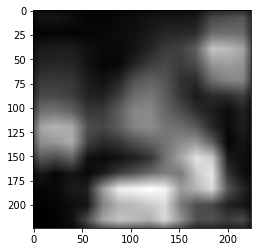

In [64]:
from skimage import transform
scaled_heatmap = transform.resize(heatmap, (224, 224))
plt.imshow(scaled_heatmap, plt.cm.gray)

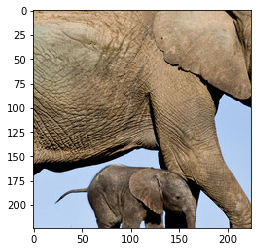

In [65]:
original_image = img_tensor.squeeze().numpy().transpose([1, 2, 0])
mean = np.array([.485, .456, .406])
std = np.array([.229, .224, .225])
original_image = original_image * std + mean
plt.imshow(original_image)

In [76]:
overlayed = np.stack([0.55*scaled_heatmap*original_image[:,:,i] + 0.05*original_image[:,:,i] 
                      for i in range(3)], axis=2)

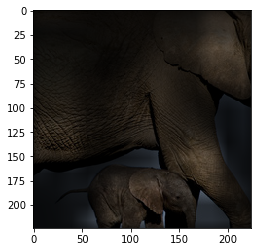

In [77]:
plt.imshow(overlayed)